# Programming Project #1: Hybrid Images

## CS445: Computational Photography

### Part I: Hybrid Images

In [1]:
import cv2

import numpy as np
import scipy
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy import signal
from skimage.color import rgb2hsv
from skimage.color import hsv2rgb

utilfn = "utils.py"
!cp "$utilfn" .
import utils

%matplotlib inline

'cp' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
im1a_file = 'accoustic.jpg'
im1b_file = 'electric.jpg'

im1a = np.float32(cv2.imread(im1a_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im1b = np.float32(cv2.imread(im1b_file, cv2.IMREAD_GRAYSCALE) / 255.0)

In [3]:
# Coordinates of the accoustic guitar photo for alignment
pts_im1a = np.array([[ 685.4298, 3063.2603], [2683.4817, 1241.8315]]) 
# Coordinates of the electric guitar photo for alignment
pts_im1b = np.array([[738.8295, 3027.8977], [2757.0115, 1762.4432]]) 

im1a, im1b = utils.align_images(im1a_file, im1b_file,pts_im1a,pts_im1b,save_images=False)

In [4]:
# convert to grayscale
im1a = cv2.cvtColor(im1a, cv2.COLOR_BGR2GRAY) / 255.0
im1b = cv2.cvtColor(im1b, cv2.COLOR_BGR2GRAY) / 255.0

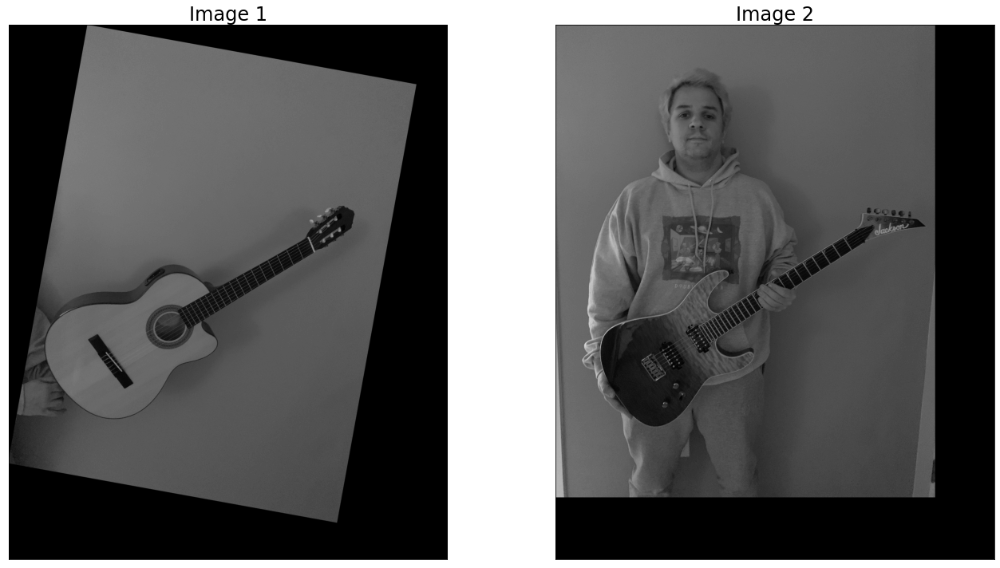

In [5]:
#Images sanity check
fig, axes = plt.subplots(1, 2, figsize=(20,10))
axes[0].imshow(im1a,cmap='gray')
axes[0].set_title('Image 1', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im1b,cmap='gray')
axes[1].set_title('Image 2', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([]);
fig.tight_layout()

In [6]:
def hybridImage(im1, im2, sigma_low, sigma_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        sigma_low: standard deviation for the low-pass filter
        sigma_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''  
    # your code goes here
   
    # Low pass filter: Oliva et al. suggest using a standard 2D Gaussian filter
    # High pass filter: they suggest using the impulse filter minus the Gaussian filter 
    #    (which can be computed by subtracting the Gaussian-filtered image from the original).
    
    #low-pass
    ksize = np.int(np.ceil(sigma_low)*6+1)
    fil = cv2.getGaussianKernel(ksize, sigma_low) # 1D kernel
    fil = fil*np.transpose(fil) # 2D kernel by outer product
    filtered_image_lowpass = cv2.filter2D(im2, -1, fil)

    #high-pass
    ksize = np.int(np.ceil(sigma_high)*6+1)
    fil = cv2.getGaussianKernel(ksize, sigma_high) # 1D kernel
    fil = fil*np.transpose(fil) # 2D kernel by outer product
    filtered_image_highpass = im1 - cv2.filter2D(im1, -1, fil)
    
    hybrid_image = filtered_image_lowpass + filtered_image_highpass
        
    return filtered_image_highpass, filtered_image_lowpass, hybrid_image

In [7]:
sigma_low = 20
sigma_high = 20

im1a_filtered, im1b_filtered, im1_hybrid = hybridImage(im1a, im1b, sigma_low, sigma_high)

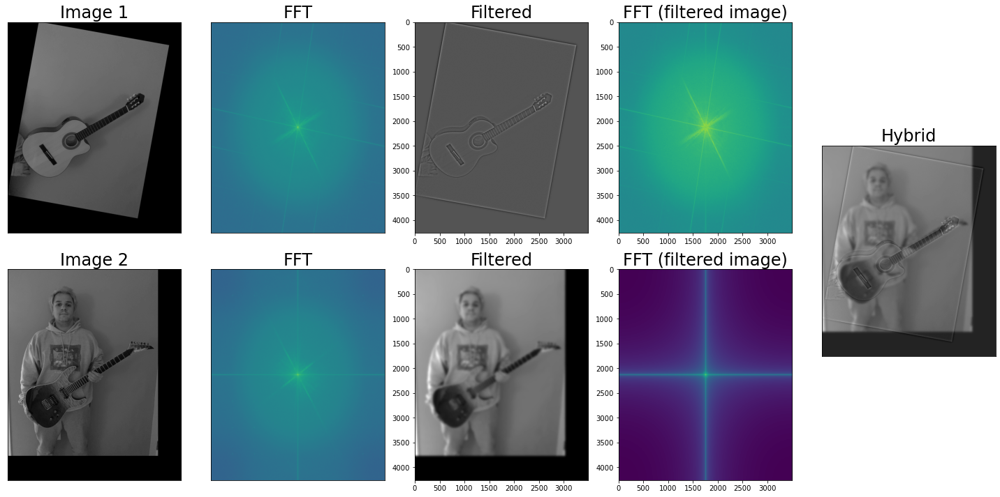

In [8]:
# The code to build the "merged" cell in matplot lib is inspired by 
# https://matplotlib.org/stable/gallery/subplots_axes_and_figures/gridspec_and_subplots.html

# This will be 3 columns and 2 rows, with the rows merged in the third column
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

# remove the ax on the last column to "merge" cells and show hybrid image more seamlessly with the 2 originals
for ax in axes[0:, -1]:
    ax.remove()

# Finally, add the subplot in the last column 
gs = axes[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[0:, -1])

# Setting title and style 
axbig.set_title('Hybrid', fontsize=24), axbig.set_xticks([]), axbig.set_yticks([])
axes[0,0].set_title('Image 1', fontsize=24), axes[0,0].set_xticks([]), axes[0,0].set_yticks([])
axes[0,1].set_title('FFT', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,0].set_title('Image 2', fontsize=24), axes[1,0].set_xticks([]), axes[1,0].set_yticks([])
axes[1,1].set_title('FFT', fontsize=24), axes[1,1].set_xticks([]), axes[1,1].set_yticks([])
axes[1,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])

# Showing images
axes[0,0].imshow(im1a,cmap='gray')
axes[0,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1a)))))
axes[0,2].imshow(im1a_filtered,cmap='gray')
axes[0,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1a_filtered)))))
axes[1,0].imshow(im1b,cmap='gray')
axes[1,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1b)))))
axes[1,2].imshow(im1b_filtered,cmap='gray')
axes[1,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1b_filtered)))))
axbig.imshow(im1_hybrid,cmap='gray')

fig.tight_layout()
plt.show()

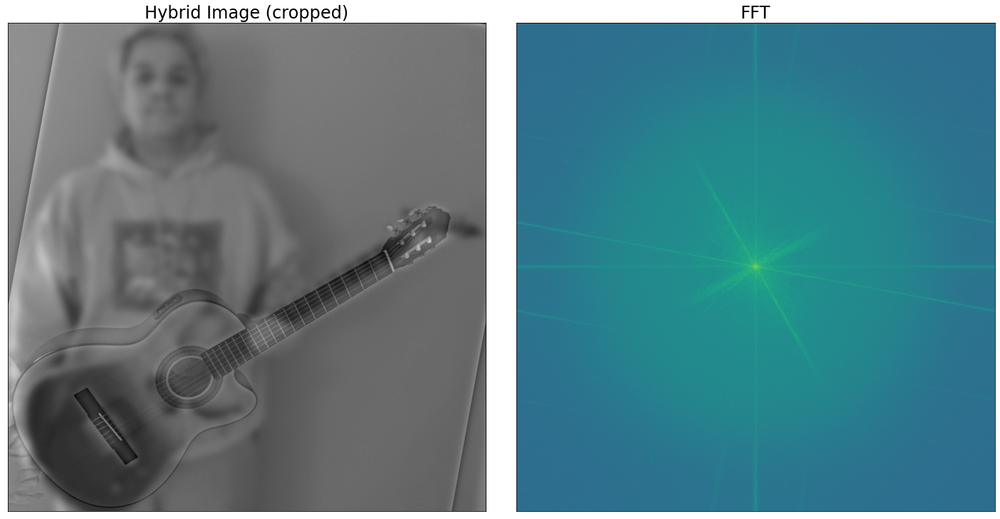

In [9]:
# Crop the image - these bounds were obtained with experimentation
im1_hybrid_cropped = im1_hybrid[407:3162, 260:2957]

fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
axes[0].set_title('Hybrid Image (cropped)', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].set_title('FFT', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([])

# Showing images
axes[0].imshow(im1_hybrid_cropped,cmap='gray')
axes[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_hybrid_cropped)))))
fig.tight_layout()
plt.show()

# Save the file to disc for debugging purposes
#cv2.imwrite(datadir + 'hybrid1.jpg',255 * im1_hybrid_cropped)

### Part IB: Hybrid Images (face photo)

In [10]:
# Another experiment, but with face swapping this time
im2a_file = 'im2a.jpg'
im2b_file = 'im2b.jpg'

im2a = np.float32(cv2.imread(im2a_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im2b = np.float32(cv2.imread(im2b_file, cv2.IMREAD_GRAYSCALE) / 255.0)

# Coordinates of both pictures for alignment
pts_im2a = np.array([[597.4865, 655.3287], [822.183, 668.54614]])
pts_im2b = np.array([[1652.4032, 1188.6168], [1925.3782, 1172.5594]])

#Align
im2a, im2b = utils.align_images(im2a_file, im2b_file,pts_im2a,pts_im2b,save_images=False)

In [11]:
# Convert to GrayScale
im2a = cv2.cvtColor(im2a, cv2.COLOR_BGR2GRAY) / 255.0
im2b = cv2.cvtColor(im2b, cv2.COLOR_BGR2GRAY) / 255.0

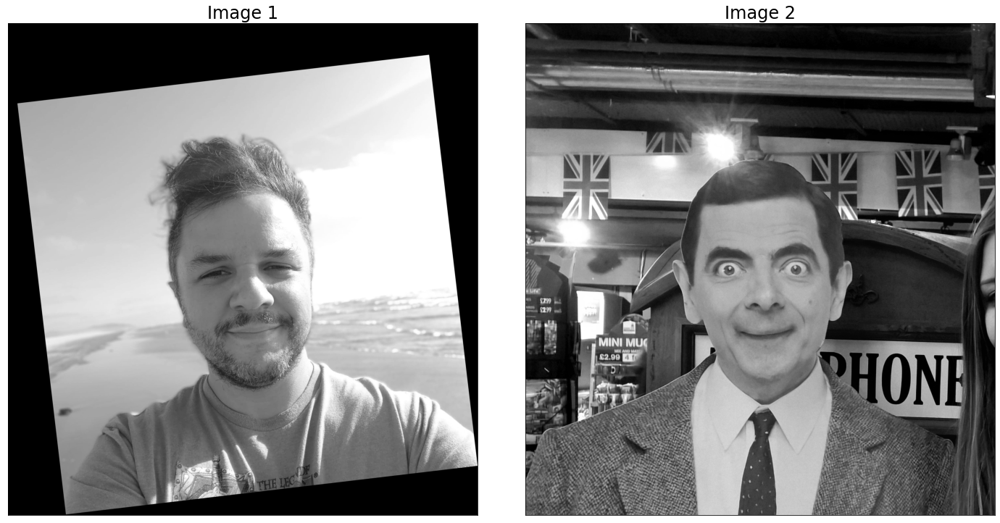

In [12]:
# Get a sanity check on the images: 
fig, axes = plt.subplots(1, 2, figsize=(20,10))
axes[0].imshow(im2a,cmap='gray')
axes[0].set_title('Image 1', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2b,cmap='gray')
axes[1].set_title('Image 2', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([]);
fig.tight_layout()

In [13]:
sigma_low = 15 
sigma_high = 15

#Invoke the "hybridImage" method
im2a_filtered, im2b_filtered, im2_hybrid = hybridImage(im2a, im2b, sigma_low, sigma_high)

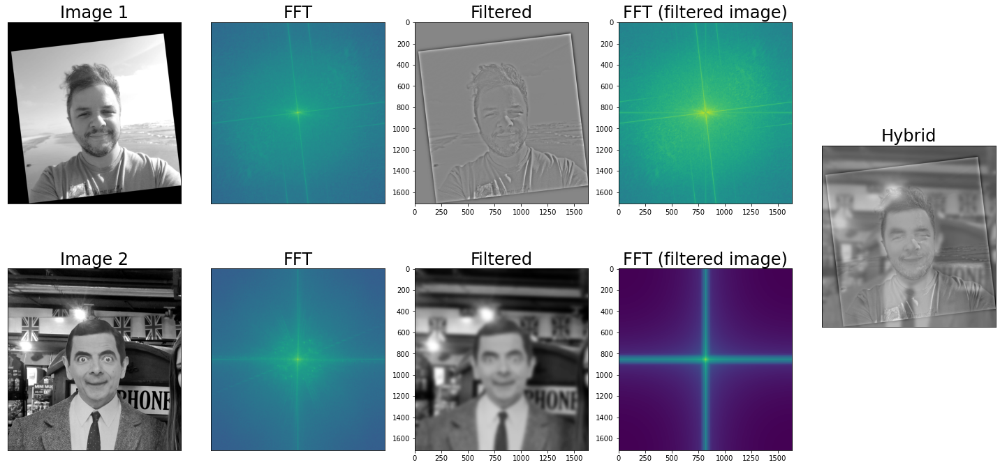

In [14]:
# The code to build the "merged" cell in matplot lib is inspired by 
# https://matplotlib.org/stable/gallery/subplots_axes_and_figures/gridspec_and_subplots.html

# This will be 3 columns and 2 rows, with the rows merged in the third column
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

# remove the ax on the last column to "merge" cells and show hybrid image more seamlessly with the 2 originals
for ax in axes[0:, -1]:
    ax.remove()

# Finally, add the subplot in the last column 
gs = axes[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[0:, -1])

# Setting title and style 
axbig.set_title('Hybrid', fontsize=24), axbig.set_xticks([]), axbig.set_yticks([])
axes[0,0].set_title('Image 1', fontsize=24), axes[0,0].set_xticks([]), axes[0,0].set_yticks([])
axes[0,1].set_title('FFT', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,0].set_title('Image 2', fontsize=24), axes[1,0].set_xticks([]), axes[1,0].set_yticks([])
axes[1,1].set_title('FFT', fontsize=24), axes[1,1].set_xticks([]), axes[1,1].set_yticks([])
axes[1,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])

# Showing images
axes[0,0].imshow(im2a,cmap='gray')
axes[0,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2a)))))
axes[0,2].imshow(im2a_filtered,cmap='gray')
axes[0,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2a_filtered)))))
axes[1,0].imshow(im2b,cmap='gray')
axes[1,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2b)))))
axes[1,2].imshow(im2b_filtered,cmap='gray')
axes[1,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2b_filtered)))))
axbig.imshow(im2_hybrid,cmap='gray')

fig.tight_layout()
plt.show()

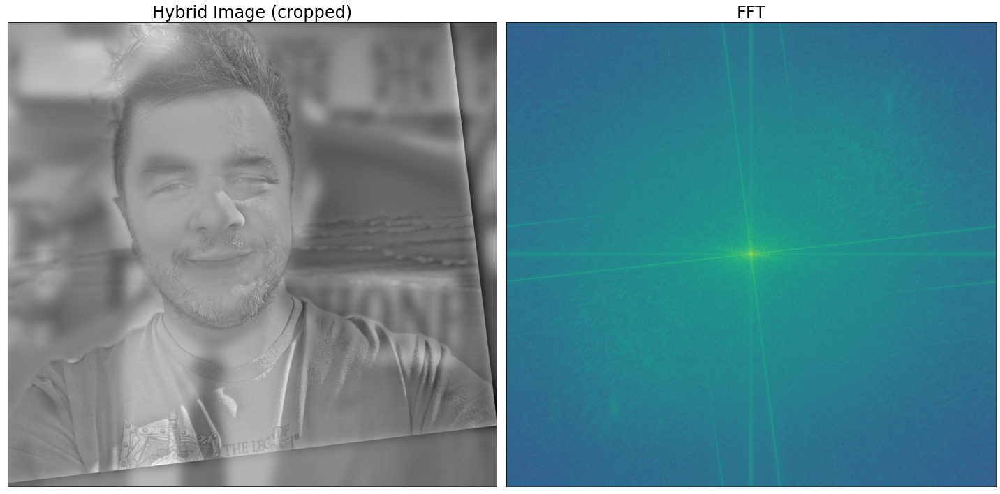

In [15]:
# Crop the image - these bounds were obtained with experimentation
im2_hybrid_cropped = im2_hybrid[407:3162, 260:2957] 

fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
axes[0].set_title('Hybrid Image (cropped)', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].set_title('FFT', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([])

# Showing images
axes[0].imshow(im2_hybrid_cropped,cmap='gray')
axes[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_hybrid_cropped)))))
fig.tight_layout()
plt.show()

# Save the file to disc for debugging purposes
#cv2.imwrite('hybrid2.jpg',255 * im1_hybrid_cropped)

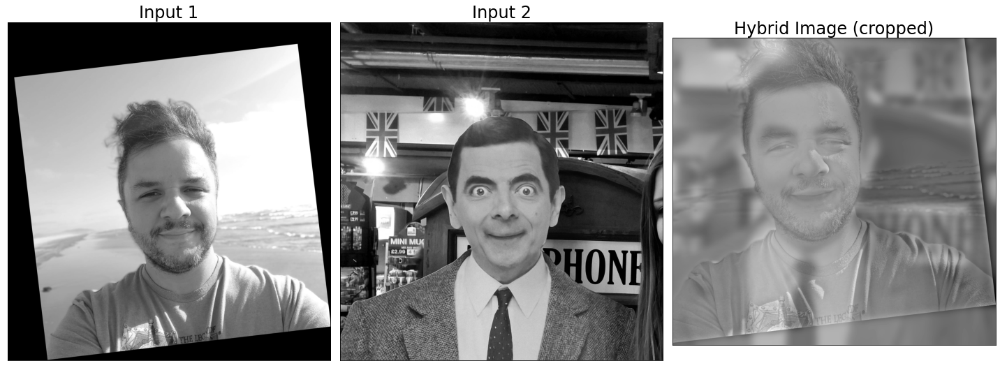

In [16]:
# Crop the image - these bounds were obtained with experimentation
im2_hybrid_cropped = im2_hybrid[407:3162, 260:2957] 

fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(20,10))
axes[0].set_title('Input 1', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].set_title('Input 2', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([])
axes[2].set_title('Hybrid Image (cropped)', fontsize=24), axes[2].set_xticks([]), axes[2].set_yticks([])

# Showing images
axes[0].imshow(im2a,cmap='gray')
axes[1].imshow(im2b, cmap='gray')
axes[2].imshow(im2_hybrid_cropped, cmap='gray')
fig.tight_layout()
plt.show()

# Save the file to disc for debugging purposes
#cv2.imwrite('hybrid2.jpg',255 * im1_hybrid_cropped)

### Part IC: Hybrid Images (landscape)

In [17]:
# Another experiment, but with object replacement this time
im3a_file = 'im3a.jpg'
im3b_file = 'im3b.jpg'

im3a = np.float32(cv2.imread(im3a_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im3b = np.float32(cv2.imread(im3b_file, cv2.IMREAD_GRAYSCALE) / 255.0)

pts_im3a = np.array([[1816.7401, 114.53082], [1784.6255, 2298.33]])
pts_im3b = np.array([[1548.3407, 152.24281], [1506.7568, 4456.175]]) 

im3a, im3b = utils.align_images(im3b_file, im3a_file,pts_im3b,pts_im3a,save_images=False)

In [18]:
# Convert to GrayScale
im3a = cv2.cvtColor(im3a, cv2.COLOR_BGR2GRAY) / 255.0
im3b = cv2.cvtColor(im3b, cv2.COLOR_BGR2GRAY) / 255.0

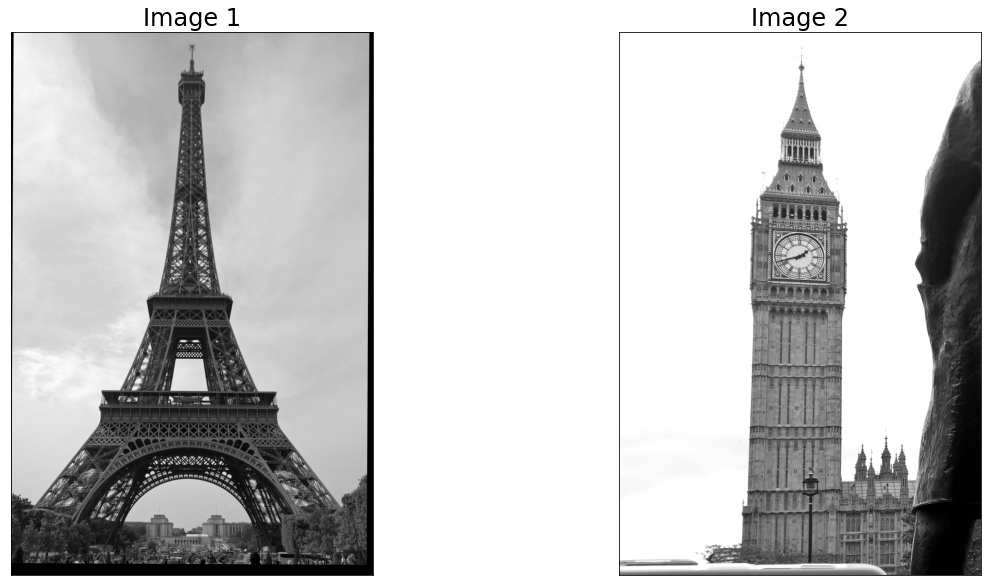

In [19]:
# Get a sanity check on the images: 
fig, axes = plt.subplots(1, 2, figsize=(20,10))
axes[0].imshow(im3a,cmap='gray')
axes[0].set_title('Image 1', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im3b,cmap='gray')
axes[1].set_title('Image 2', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [20]:
sigma_low = 15 #london
sigma_high = 5 #paris

im3a_filtered, im3b_filtered, im3_hybrid = hybridImage(im3a, im3b, sigma_low, sigma_high)

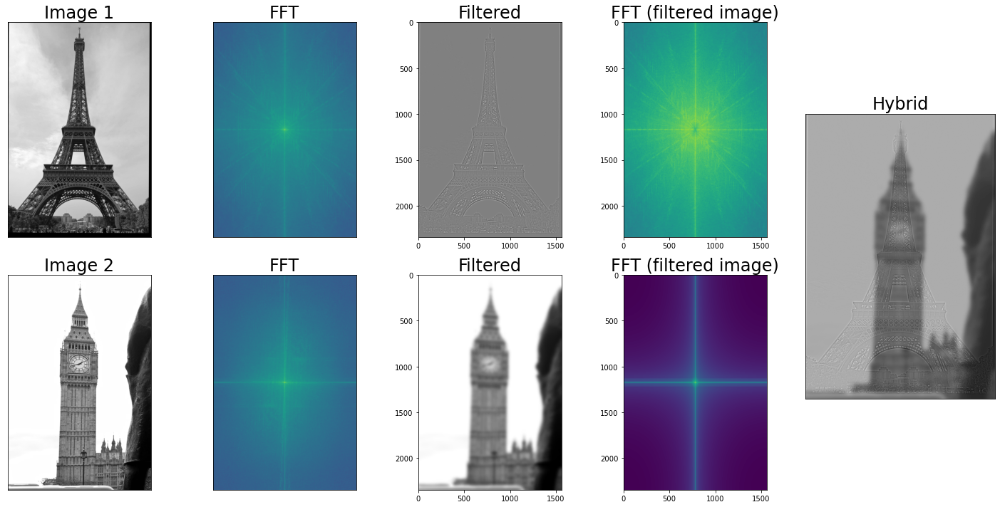

In [21]:
# The code to build the "merged" cell in matplot lib is inspired by 
# https://matplotlib.org/stable/gallery/subplots_axes_and_figures/gridspec_and_subplots.html

# This will be 3 columns and 2 rows, with the rows merged in the third column
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

# remove the ax on the last column to "merge" cells and show hybrid image more seamlessly with the 2 originals
for ax in axes[0:, -1]:
    ax.remove()

# Finally, add the subplot in the last column 
gs = axes[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[0:, -1])

# Setting title and style 
axbig.set_title('Hybrid', fontsize=24), axbig.set_xticks([]), axbig.set_yticks([])
axes[0,0].set_title('Image 1', fontsize=24), axes[0,0].set_xticks([]), axes[0,0].set_yticks([])
axes[0,1].set_title('FFT', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[0,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,0].set_title('Image 2', fontsize=24), axes[1,0].set_xticks([]), axes[1,0].set_yticks([])
axes[1,1].set_title('FFT', fontsize=24), axes[1,1].set_xticks([]), axes[1,1].set_yticks([])
axes[1,2].set_title('Filtered', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])
axes[1,3].set_title('FFT (filtered image)', fontsize=24), axes[0,1].set_xticks([]), axes[0,1].set_yticks([])

# Showing images
axes[0,0].imshow(im3a,cmap='gray')
axes[0,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3a)))))
axes[0,2].imshow(im3a_filtered,cmap='gray')
axes[0,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3a_filtered)))))
axes[1,0].imshow(im3b,cmap='gray')
axes[1,1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3b)))))
axes[1,2].imshow(im3b_filtered,cmap='gray')
axes[1,3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3b_filtered)))))
axbig.imshow(im3_hybrid,cmap='gray')

fig.tight_layout()
plt.show()


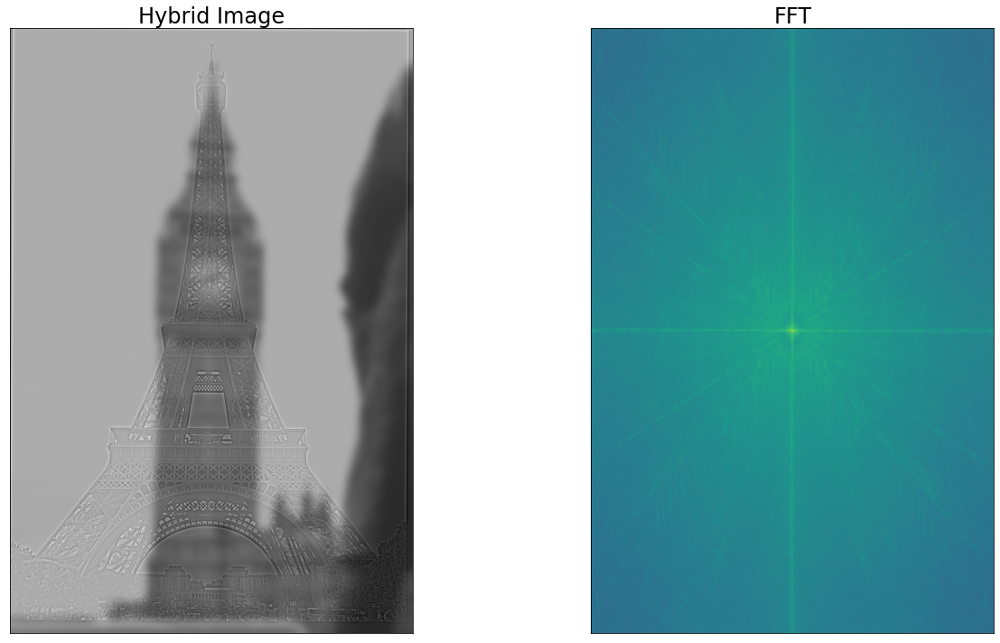

In [22]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
axes[0].set_title('Hybrid Image', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].set_title('FFT', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([])

# Showing images
axes[0].imshow(im3_hybrid,cmap='gray')
axes[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3_hybrid)))))
fig.tight_layout()
plt.show()

# Save the file to disc to debug
#cv2.imwrite(datadir + 'hybrid3.jpg',255 * im3_hybrid)

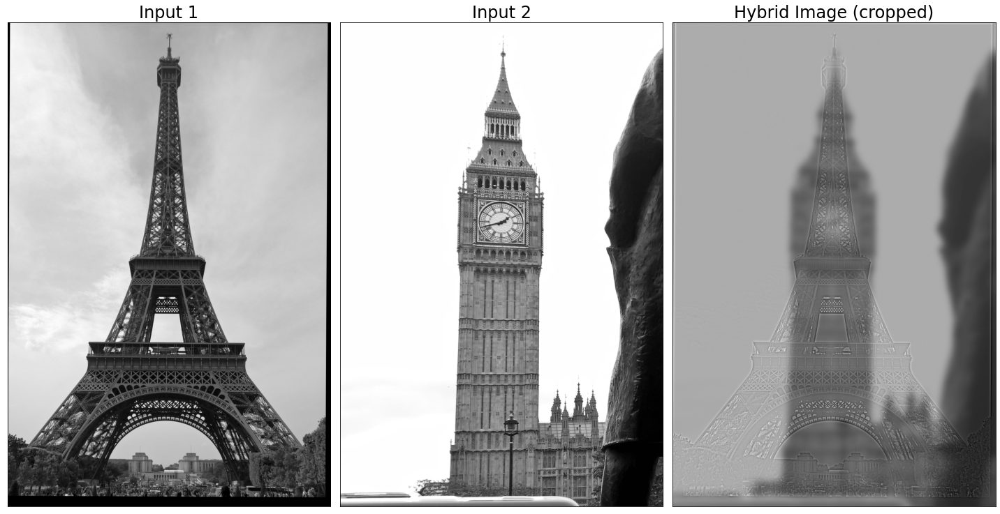

In [23]:
fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(20,10))
axes[0].set_title('Input 1', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].set_title('Input 2', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([])
axes[2].set_title('Hybrid Image (cropped)', fontsize=24), axes[2].set_xticks([]), axes[2].set_yticks([])

# Showing images
axes[0].imshow(im3a,cmap='gray')
axes[1].imshow(im3b, cmap='gray')
axes[2].imshow(im3_hybrid, cmap='gray')
fig.tight_layout()
plt.show()

# Save the file to disc for debugging purposes
#cv2.imwrite('hybrid2.jpg',255 * im1_hybrid_cropped)

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

In [26]:
# load a file with bad contrast
im_bad_contrast_file ='badcontrast.jpg'
im_bad_contrast = np.float32(cv2.imread(im_bad_contrast_file))

Text(0.5, 1.0, 'Histogram')

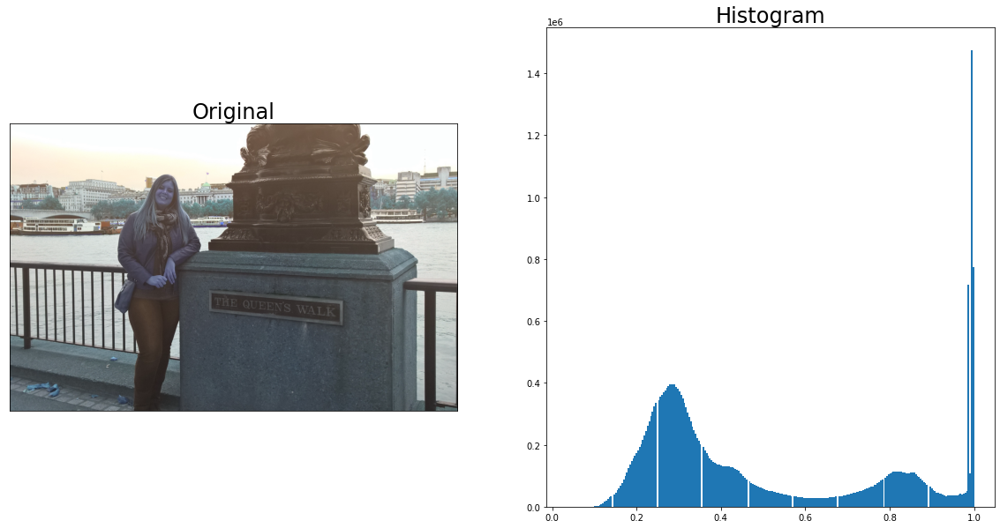

In [28]:
# Show the image and its histogram
hist, bins = np.histogram(im_bad_contrast / 255, bins=255)

fig, axes = plt.subplots(1, 2, figsize=(20,10))
axes[0].imshow(im_bad_contrast / 255)
axes[0].set_title('Original', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].hist(bins[:-1], bins, weights=hist)
axes[1].set_title('Histogram', fontsize=24)

In [29]:
# Implementing "Global Histogram Equalization": 

# Convert the picture to HSV and separate the "Value" (V) channel
im_bad_contrast_hsv = rgb2hsv(im_bad_contrast)

v = im_bad_contrast_hsv[:, :, 2] / 255

# Compute cumulative histogram
hist_v, bins = np.histogram(v, bins=255)
c = hist_v.cumsum()

# Get the number of pixels in the image. I'll need that for the equation
N = v.size

# Alpha will control affect how much contrast I want to apply to my image
alpha = 0.5

# This is the formula, per Professor Hoiem's lecture: 
# f(i) = alpha * (c(i)/N) * 255 + (1- alpha) - i
im_bad_contrast_corrected = alpha * c[v.astype(int)]/N * 255 + (1-alpha) * v
v1 = c[(v * 255).astype(int) - 1] /N
finalv = v * (1-alpha) + v1 * alpha

im_bad_contrast_hsv[:, :, 2] = finalv 
im_bad_contrast_corrected = hsv2rgb(im_bad_contrast_hsv)

In the enhanced picture, with the adjusted contrast, we get the following benefits: 
- Much clearer details on the statue
- Easier to read the sign "The queen's walk"
- Better definition in the stone that holds the statue
- Better shadows in areas like the sidewalk near the iron fence

Note that the values are better spread out through the histogram. 

Text(0.5, 1.0, 'Histogram of the enhanced picture')

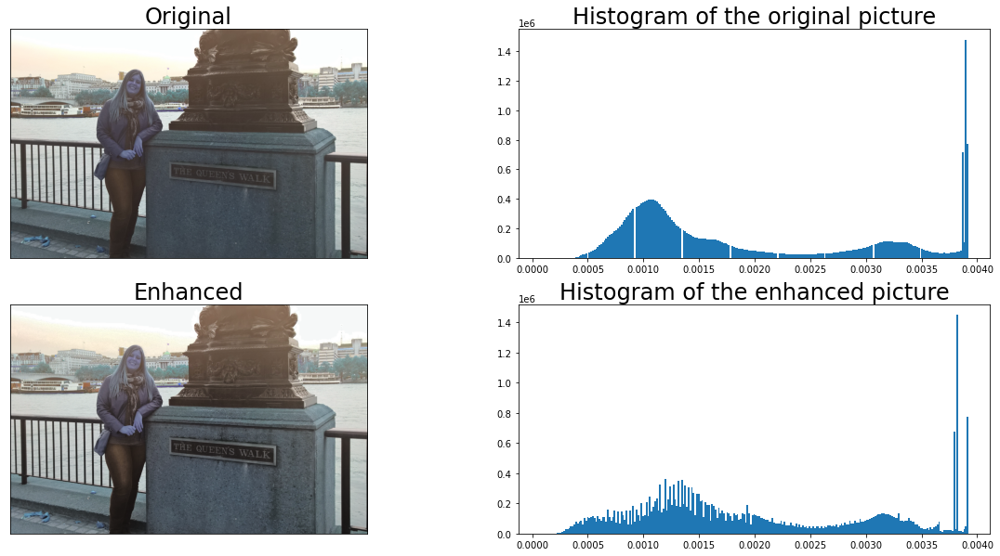

In [30]:
# Show the enhanced image and its histogram, compared to the original
hist_enhanced, bins = np.histogram(im_bad_contrast_corrected / 255, bins=255)

fig, axes = plt.subplots(2, 2, figsize=(20,10))
axes[0,0].imshow(im_bad_contrast / 255)
axes[0,0].set_title('Original', fontsize=24), axes[0,0].set_xticks([]), axes[0,0].set_yticks([])
axes[0,1].hist(bins[:-1], bins, weights=hist)
axes[0,1].set_title('Histogram of the original picture', fontsize=24)
axes[1,0].imshow(im_bad_contrast_corrected)
axes[1,0].set_title('Enhanced', fontsize=24), axes[1,0].set_xticks([]), axes[1,0].set_yticks([]);
axes[1,1].hist(bins[:-1], bins, weights=hist_enhanced)
axes[1,1].set_title('Histogram of the enhanced picture', fontsize=24)

In [31]:
cv2.imwrite('corrected_contrast.png', np.hstack((im_bad_contrast,im_bad_contrast_corrected * 255)))

True

#### Color enhancement 

In [32]:
im_bad_colors_file ='badcolors.jpg'
im_bad_colors = cv2.imread('badcolors.jpg')

(Text(0.5, 1.0, 'Original'), [], [])

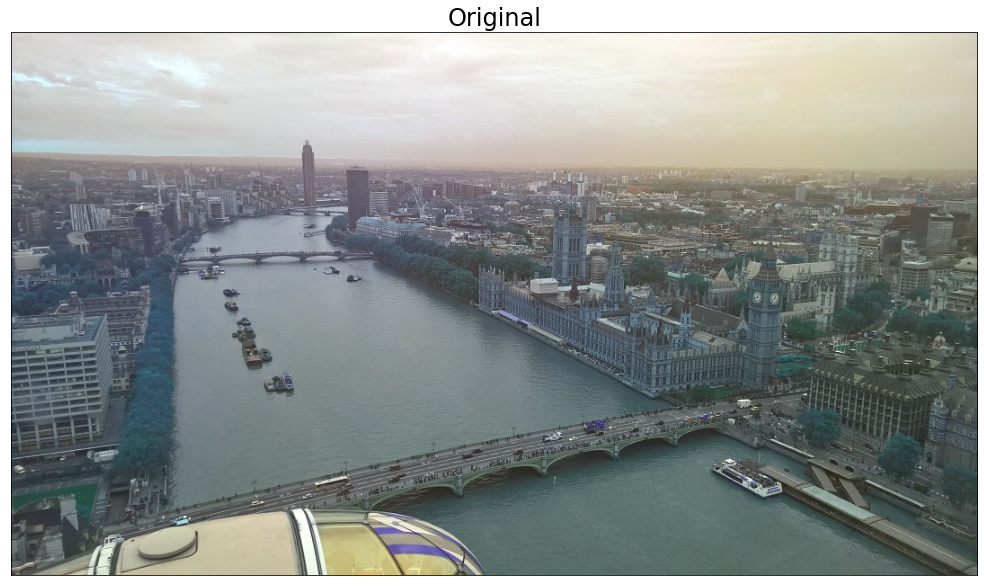

In [33]:
#Images sanity check
fig, axes = plt.subplots(1, 1, figsize=(20,10))
axes.imshow(im_bad_colors / 255,cmap='gray')
axes.set_title('Original', fontsize=24), axes.set_xticks([]), axes.set_yticks([])

In [34]:
# Approach #1: equalize histogram over the S channel 
hsv_image = cv2.cvtColor(im_bad_colors, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)

s = cv2.equalizeHist(s)

hsv_image_histogram = cv2.merge([h,s,v])
hsv_image_histogram = cv2.cvtColor(hsv_image_histogram, cv2.COLOR_HSV2BGR)

# Write to a file for debugging
#cv2.imwrite('corrected_colors_approach1.png', np.vstack((hsv_image,hsv_image_histogram)))

# Approach #2: linear adjustment using a constant
hsv_image = cv2.cvtColor(im_bad_colors, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)

s = s * 2

hsv_image_constant = cv2.merge([h,s,v])
hsv_image_constant = cv2.cvtColor(hsv_image_constant, cv2.COLOR_HSV2BGR)

# Write to a file for debugging 
#hsv_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
#cv2.imwrite('corrected_colors.png', np.vstack((hsv_image,hsv_image_histogram, hsv_image_constant)))

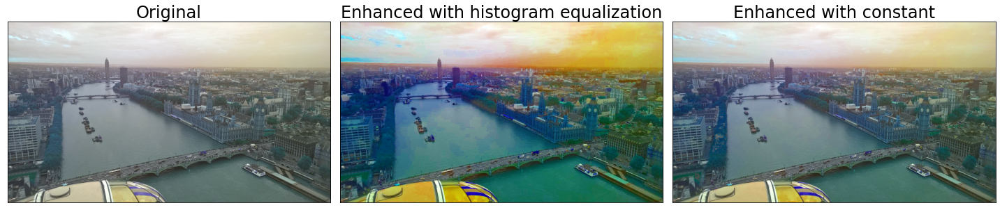

In [35]:
fig, axes = plt.subplots(1,3, figsize=(20,20))
axes[0].imshow(im_bad_colors / 255), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[0].set_title('Original', fontsize=24)
axes[1].imshow(hsv_image_histogram), axes[1].set_xticks([]), axes[1].set_yticks([])
axes[1].set_title('Enhanced with histogram equalization', fontsize=24)
axes[2].imshow(hsv_image_constant), axes[2].set_xticks([]), axes[2].set_yticks([])
axes[2].set_title('Enhanced with constant', fontsize=24)
fig.tight_layout()
plt.show()

#### Color shift

In [36]:
hsv_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
cv2.imwrite('corrected_colors.png', np.hstack((hsv_image,hsv_image_constant)))


True